# Predicting Telecom Churn

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import re
import pandas_profiling

#Filter Warnings
import warnings
warnings.filterwarnings('ignore')


#
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
raw = pd.read_csv('telecom_churn_data.csv')

In [3]:
raw.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

In [4]:
raw.shape

(99999, 226)

In [5]:
raw.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [50]:
raw.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               99999 non-null int64
circle_id                   99999 non-null int64
loc_og_t2o_mou              98981 non-null float64
std_og_t2o_mou              98981 non-null float64
loc_ic_t2o_mou              98981 non-null float64
last_date_of_month_6        99999 non-null object
last_date_of_month_7        99398 non-null object
last_date_of_month_8        98899 non-null object
last_date_of_month_9        98340 non-null object
arpu_6                      99999 non-null float64
arpu_7                      99999 non-null float64
arpu_8                      99999 non-null float64
arpu_9                      99999 non-null float64
onnet_mou_6                 96062 non-null float64
onnet_mou_7                 96140 non-null float64
onnet_mou_8                 94621 non-null float64
onnet_mou_9                 92254 non-null float64
offnet_mou_6                960

In [51]:
# percentage of null values column wise
round(100*raw.isnull().sum() / raw.shape[0],2)

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
last_date_of_month_9         1.66
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
arpu_9                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
onnet_mou_9                  7.75
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
offnet_mou_9                 7.75
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_ic_mou_9                7.75
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
roam_og_mou_9                7.75
loc_og_t2t_mou

40 columns have more than 70% missing values. 
Let's filter out high value customers and then check missing value percentage.

### Filtering out high value customers

In [6]:
# calculating Recharge amount in Good phase.
raw['rech_good_phase'] = raw['total_rech_amt_6'] + raw['total_rech_amt_7']

In [53]:
raw['rech_good_phase'].describe(percentiles=[0.25,0.50,0.70,0.75,0.90])

count    99999.000000
mean       650.477585
std        741.666932
min          0.000000
25%        230.000000
50%        458.000000
70%        737.000000
75%        838.000000
90%       1396.000000
max      75525.000000
Name: rech_good_phase, dtype: float64

In [54]:
raw.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,

In [7]:
seventy = raw['rech_good_phase'].quantile(.70)

In [8]:
# Getting high value customers in one frame
high_val = raw[(raw['rech_good_phase'] > seventy)]
high_val.shape

(29979, 227)

### Treating Missing Values

#### Removing columns with more than 60% missing values

In [9]:
# Checking null values again
null_per = round(high_val.isnull().sum()/high_val.shape[0] * 100,2)
# Columns with more than 60% missing values
null_per[null_per > 60]

date_of_last_rech_data_6    62.02
date_of_last_rech_data_7    61.13
date_of_last_rech_data_8    60.84
date_of_last_rech_data_9    61.82
total_rech_data_6           62.02
total_rech_data_7           61.13
total_rech_data_8           60.84
total_rech_data_9           61.82
max_rech_data_6             62.02
max_rech_data_7             61.13
max_rech_data_8             60.84
max_rech_data_9             61.82
count_rech_2g_6             62.02
count_rech_2g_7             61.13
count_rech_2g_8             60.84
count_rech_2g_9             61.82
count_rech_3g_6             62.02
count_rech_3g_7             61.13
count_rech_3g_8             60.84
count_rech_3g_9             61.82
av_rech_amt_data_6          62.02
av_rech_amt_data_7          61.13
av_rech_amt_data_8          60.84
av_rech_amt_data_9          61.82
arpu_3g_6                   62.02
arpu_3g_7                   61.13
arpu_3g_8                   60.84
arpu_3g_9                   61.82
arpu_2g_6                   62.02
arpu_2g_7     

In [10]:
col = list(null_per[null_per <60].index)
high_val = high_val[col]

In [59]:
high_val.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,0.0,0.0,0.0,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,0.0,0.0,0.0,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,6/27/2014,7/25/2014,8/26/2014,9/30/2014,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,2370
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.1

Some columns have redundant information (no change in information). Removing such columns :

In [11]:
high_val.drop(['std_og_t2c_mou_6', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_8',
    'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_ic_t2o_mou_9',
    'std_og_t2c_mou_7', 'std_ic_t2o_mou_7', 'loc_og_t2o_mou', 'std_og_t2o_mou',
    'loc_ic_t2o_mou', 'circle_id', 'mobile_number'],1,inplace=True)

In [12]:
high_val.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9'],1,inplace=True)

### Defining Churned customers

We still have some columns with missing values, which are relatively low. 
Let's define churned customers based on usage i.e. incoming , outgoing minutes of usage , usage of 2g and 3g internet services in the churned month (9).

In [13]:
# Customers with 0 ic, og and mobile data usage
def churned_cust(data):
    if ((data['total_og_mou_9']==0) & (data['total_ic_mou_9']==0) & (data['vol_2g_mb_9']==0) & (data['vol_3g_mb_9']==0)):
        return 1
    else:
        return 0

In [14]:
high_val['churn'] = high_val.apply(churned_cust, axis=1)

In [15]:
high_val.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase,churn
7,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,6/27/2014,7/25/2014,8/26/2014,9/30/2014,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,2370,1
8,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.53,103.86,28.49,16.54,34.91,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.

### Now deleting all the columns of month 9 i.e. churn phase, as this data will not be availbe at the time of prediction.

In [16]:
cols_ = list(high_val.columns)
attribute_9=[]

In [17]:
for col in cols_:
    if re.search('\_9', col):
        attribute_9.append(col)

In [18]:
high_val.drop(attribute_9,1,inplace=True)

In [19]:
high_val.shape

(29979, 130)

In [69]:
round(high_val.isnull().sum()/high_val.shape[0] * 100,2)

arpu_6                 0.00
arpu_7                 0.00
arpu_8                 0.00
onnet_mou_6            1.05
onnet_mou_7            1.01
onnet_mou_8            3.13
offnet_mou_6           1.05
offnet_mou_7           1.01
offnet_mou_8           3.13
roam_ic_mou_6          1.05
roam_ic_mou_7          1.01
roam_ic_mou_8          3.13
roam_og_mou_6          1.05
roam_og_mou_7          1.01
roam_og_mou_8          3.13
loc_og_t2t_mou_6       1.05
loc_og_t2t_mou_7       1.01
loc_og_t2t_mou_8       3.13
loc_og_t2m_mou_6       1.05
loc_og_t2m_mou_7       1.01
loc_og_t2m_mou_8       3.13
loc_og_t2f_mou_6       1.05
loc_og_t2f_mou_7       1.01
loc_og_t2f_mou_8       3.13
loc_og_t2c_mou_6       1.05
loc_og_t2c_mou_7       1.01
loc_og_t2c_mou_8       3.13
loc_og_mou_6           1.05
loc_og_mou_7           1.01
loc_og_mou_8           3.13
std_og_t2t_mou_6       1.05
std_og_t2t_mou_7       1.01
std_og_t2t_mou_8       3.13
std_og_t2m_mou_6       1.05
std_og_t2m_mou_7       1.01
std_og_t2m_mou_8    

In [20]:
# missing value % row wise.
len(high_val[high_val.isnull().sum(axis=1) > 1].index)/high_val.shape[0] * 100

3.939424263651223

Only 4% rows have missing values. Dropping rows with missing values. 

In [21]:
high_val.dropna(inplace=True)

In [22]:
# Shape After dropping missing values
high_val.shape

(28455, 130)

In [23]:
high_val['churn'].value_counts()

0    26706
1     1749
Name: churn, dtype: int64

In [24]:
high_val['churn'].sum()/len(high_val['churn'].index)

0.06146547179757512

We have only 6% churn rate in the current data. Which shows high class imbalance.

### Feature Engineering

In [25]:
date_col = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']

high_val[date_col] = high_val[date_col].apply(pd.to_datetime, format='%m/%d/%Y')

In [26]:
for col in date_col:
    high_val[col + '_Year'] = high_val[col].dt.year
    high_val[col + '_Month'] = high_val[col].dt.month
    high_val[col + '_day'] = high_val[col].dt.day

In [27]:
high_val.drop(date_col,1,inplace=True)

In [28]:
high_val.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase,churn,date_of_last_rech_6_Year,date_of_last_rech_6_Month,date_of_last_rech_6_day,date_of_last_rech_7_Year,date_of_last_rech_7_Month,date_of_last_rech_7_day,date_of_last_rech_8_Year,date_of_last_rech_8_Month,date_of_last_rech_8_day
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,2370,1,2014,6,27,2014,7,25,2014,8,26
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,1038,0,2014,6,25,2014,7,31,2014,8,30
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,

In [29]:
# differece in revenue of good phase and action phase
high_val['arpu_diff'] = high_val['arpu_8'] - ((high_val['arpu_6'] + high_val['arpu_7'])/2 )

In [30]:
# differece in minutes of usage t2t of good phase and action phase
high_val['onnet_mou_diff'] = high_val['onnet_mou_8'] - ((high_val['onnet_mou_6'] + high_val['onnet_mou_7'])/2 )

In [31]:
# differece in minutes of usage t2other of good phase and action phase
high_val['offnet_mou_diff'] = high_val['offnet_mou_8'] - ((high_val['offnet_mou_6'] + high_val['offnet_mou_7'])/2 )

In [32]:
# differece in recharge amount of good phase and action phase
high_val['total_rech_amt_diff'] = high_val['total_rech_amt_8'] - ((high_val['total_rech_amt_6'] + high_val['total_rech_amt_7'])/2 )

In [33]:
# differece in minutes of usage outgoing calls of good phase and action phase
high_val['total_og_mou_diff'] = high_val['total_og_mou_8'] - ((high_val['total_og_mou_6'] + high_val['total_og_mou_7'])/2 )

### Outlier Treatment

In [84]:
high_val.describe(percentiles=[0.05,0.1,0.25,0.50,0.75,0.90,0.95,0.99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase,churn,date_of_last_rech_6_Year,date_of_last_rech_6_Month,date_of_last_rech_6_day,date_of_last_rech_7_Year,date_of_last_rech_7_Month,date_of_last_rech_7_day,date_of_last_rech_8_Year,date_of_last_rech_8_Month,date_of_last_rech_8_day,arpu_diff,onnet_mou_diff,offnet_mou_diff,total_rech_amt_diff,total_og_mou_diff
count,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.00000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.0,28455.0,28455.00000,28455.0,28455.0,28455.000000,28455.0,28455.0,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000,28455.000000
mean,585.222943,597.457377,551.837418,297.143900,310.670043,278.135890,418.

In [34]:
# deleting rows below 0.05 quantile and above 0.99 quantile
Q1 = high_val.quantile(0.05)
Q3 = high_val.quantile(0.99)
IQR = Q3-Q1
high_val = high_val[~((high_val < (Q1 - 1.5 * IQR)) |(high_val > (Q3 + 1.5 * IQR))).any(axis=1)]

In [35]:
high_val.shape

(26065, 141)

In [211]:
pandas_profiling.ProfileReport(high_val)

Number of variables,137
Number of observations,28455
Total Missing (%),0.0%
Total size in memory,29.7 MiB
Average record size in memory,1.1 KiB
Numeric,124
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,12


In [36]:
# Deleting columns for which values are not changing
high_val.drop(['date_of_last_rech_6_Year','date_of_last_rech_6_Month','date_of_last_rech_7_Year','date_of_last_rech_7_Month','date_of_last_rech_8_Year','date_of_last_rech_8_Month'],1,inplace=True)

### Bivariate Analysis

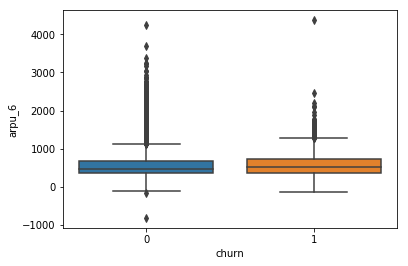

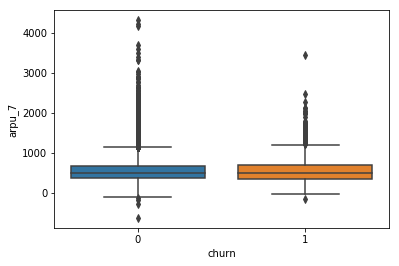

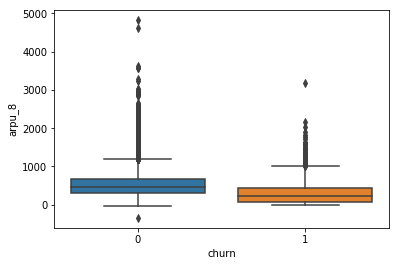

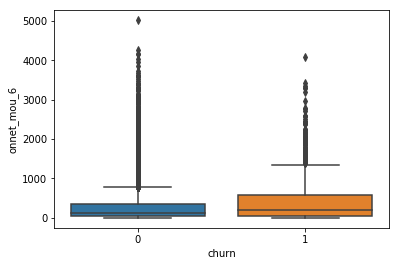

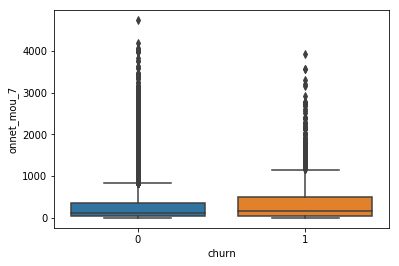

...

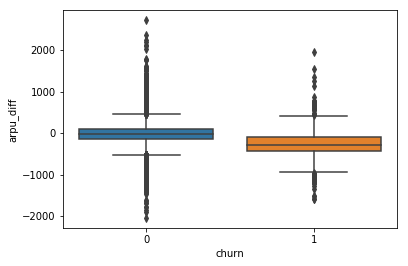

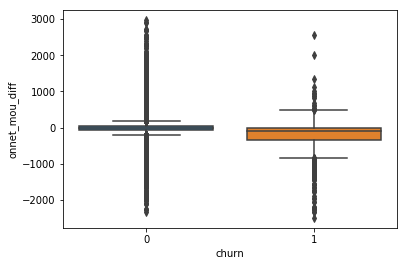

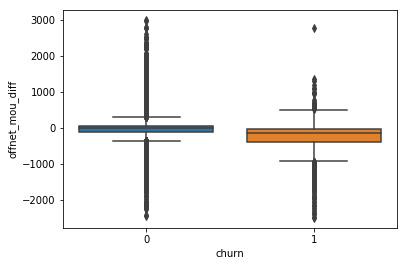

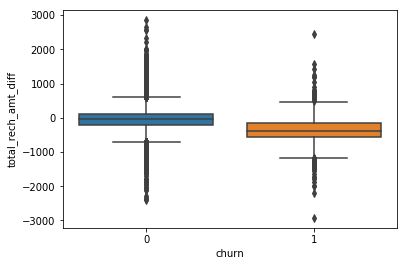

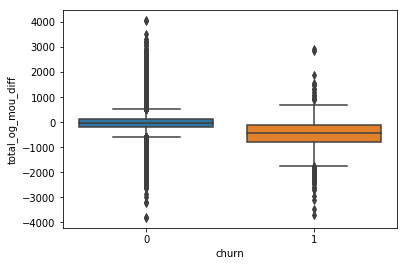

In [89]:
for _column in high_val.columns:
    plt.figure()
    sns.boxplot(y=_column, x='churn', data=high_val, orient='v')
    plt.show()

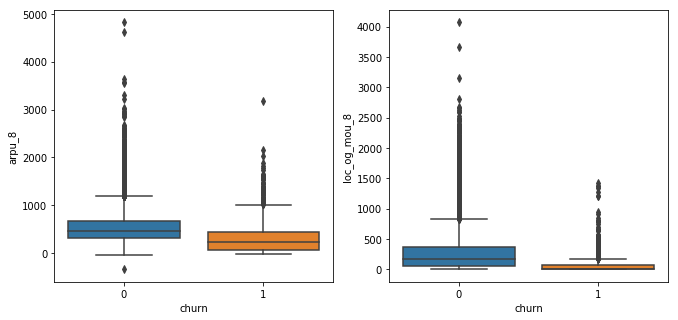

In [137]:
plt.figure(figsize=(11,5))
plt.subplot(1,2,1)
sns.boxplot(y='arpu_8', x='churn', data=high_val, orient='v')
plt.subplot(1,2,2)
sns.boxplot(y='loc_og_mou_8', x='churn', data=high_val, orient='v')

Customers having low average revenue or low outgoing call usage, in action phase are more likely to churn

### Checking correlation

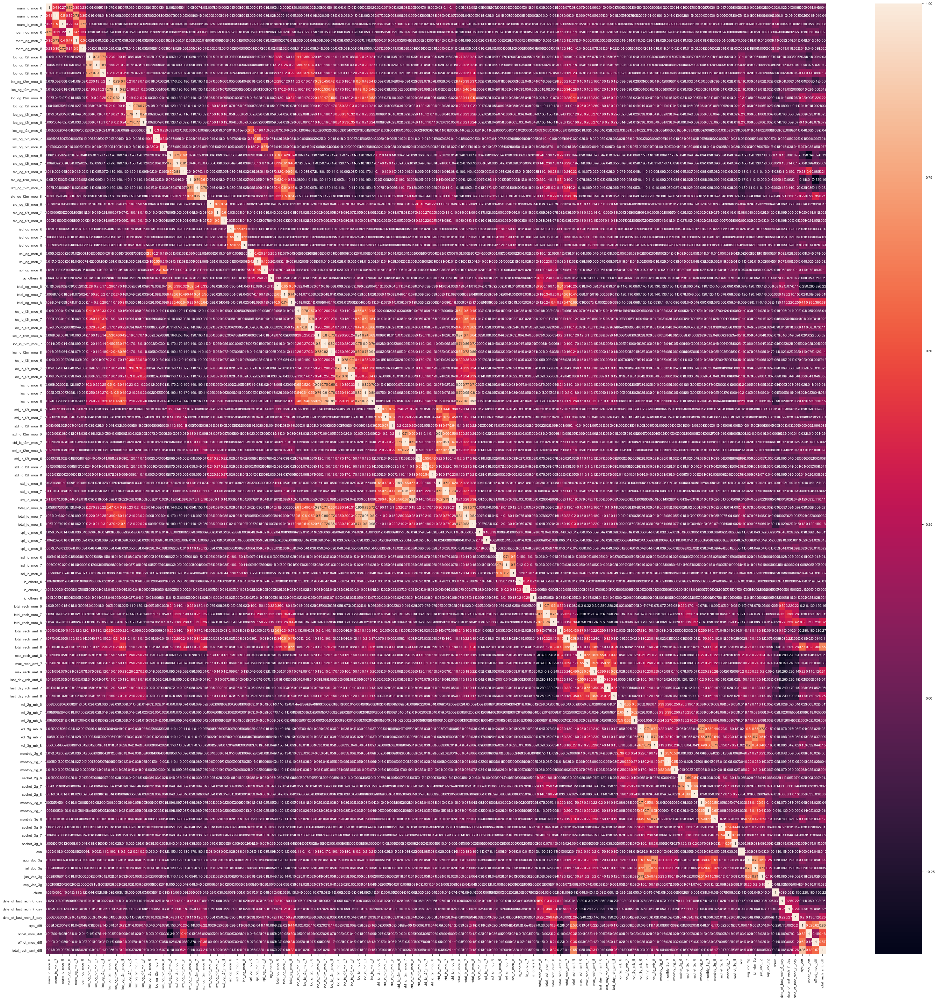

In [442]:
%matplotlib inline
# Let's see the correlation matrix 
plt.figure(figsize = (50,50))        # Size of the figure
sns.heatmap(high_val.corr(),annot = True)

In [437]:
# Deleting highly correlated columns
#high_val.drop(['og_others_7','og_others_8','rech_good_phase','arpu_6','arpu_7','arpu_8',
 #              'std_og_mou_6','std_og_mou_7','std_og_mou_8','total_og_mou_diff'],1,inplace=True)

In [441]:
#high_val.drop(['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8',
 #              'onnet_mou_6','onnet_mou_7','onnet_mou_8',
  #            'offnet_mou_6','offnet_mou_7','offnet_mou_8'],1,inplace=True)

In [443]:
# high_val.drop(['loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8'],1,inplace=True)

In [436]:
high_val.corr()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase,churn,date_of_last_rech_6_day,date_of_last_rech_7_day,date_of_last_rech_8_day,arpu_diff,onnet_mou_diff,offnet_mou_diff,total_rech_amt_diff,total_og_mou_diff
arpu_6,1.000000,0.546575,0.461710,0.376528,0.188747,0.158072,0.542715,0.301416,0.260426,0.096774,0.073161,0.090213,0.163219,0.114034,0.120595,0.187875,0.131013,0.121712,0.372728,0.260228,0.234646,0.152671,0.107646,0.104627,0.068494,0.009736,0.014772,0.373947,0.261996,0.235489,0.299412,0.132874,0.107981,0.342529,0.163708,0.134562,0.056484,0.031483,0.027885,0.438005,0.202808,0.162803,0.102447,0.033139,0.030731,0.130275,0.037960,0.033852,0.126763,NaN,NaN,0.631816,0.337612,0.275313,0.136958,0.091667,0.085424,0.211553,0.154452,0.141367,0.074113,0.054222,0.056764,0.224659,0.161518,0.147658,0.124439,0.075619,0.064105,0.121007,0.061514,0.051380,0.041538,0.026897,0.025823,0.152549,0.083271,6.891360e-02,0.254639,0.175605,0.156692,0.021896,-0.070486,-0.011467,0.036620,0.020404,0.014964,0.047766,0.035356,0.035102,0.372265,0.111353,0.100282,0.929209,0.514575,0.444518,0.274008,0.188452,0.209175,0.204644,0.127309,0.146246,0.040004,-0.003114,0.007925,0.248817,0.160969,0.162133,0.037945,-0.011864,0.004221,0.006537,-2.660172e-02,-0.025964,0.269225,0.159335,0.180370,0.051607,0.017137,0.019644,0.017027,0.143903,0.144666,0.203309,0.070458,0.845416,0.024059,0.161608,0.004800,0.058143,-0.306217,-0.182962,-0.234993,-0.255225,-0.263462
arpu_7,0.546575,1.000000,0.651266,0.207796,0.371521,0.295694,0.326036,0.529094,0.411983,0.077207,0.084390,0.086604,0.109236,0.136771,0.127521,0.103632,0.183626,0.150675,0.220486,0.345725,0.276722,0.099619,0.131882,0.111141,0.018741,0.067628,0.041512,0.217513,0.352905,0.280945,0.163446,0.301637,0.241936,0.207189,0.357195,0.277769,0.032594,0.046062,0.031992,0.252874,0.450228,0.348835,0.038194,0.096857,0.043231,0.047905,0.119278,0.086177,0.039974,NaN,NaN,0.364891,0.628415,0.474155,0.069852,0.127417,0.112476,0.119205,0.195839,0.167888,0.027043,0.045568,0.043403,0.121683,0.206218,0.176741,0.078234,0.123547,0.105939,0.070179,0.117545,0.096311,0.029269,0.038081,0.029458,0.091527,0.148986,1.215897e-01,0.140067,0.238294,0.199261,-0.021730,-0.009067,-0.014281,0.018256,0.040902,0.024138,0.013752,0.051246

In [37]:
high_val.shape

(26065, 135)

In [38]:
X = high_val.drop('churn',1)
y = high_val['churn']
X_columns = X.columns

In [39]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [40]:
# Scaling features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train[X_columns] = scaler.fit_transform(X_train)

In [41]:
# Train data after scaling
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,rech_good_phase,date_of_last_rech_6_day,date_of_last_rech_7_day,date_of_last_rech_8_day,arpu_diff,onnet_mou_diff,offnet_mou_diff,total_rech_amt_diff,total_og_mou_diff
51720,-0.906306,-0.436590,0.518906,-0.455264,-0.295680,-0.331612,-0.039242,-0.353665,-0.134612,-0.26004,-0.228024,-0.234129,-0.285515,-0.253733,-0.25703,0.054290,0.438369,0.272425,0.840755,0.055395,0.546732,-0.320588,-0.374083,-0.393004,-0.300547,-0.309698,-0.306246,0.606854,0.266617,0.514602,-0.490620,-0.494673,-0.453587,-0.502969,-0.362674,-0.425925,-0.212501,-0.215488,0.404907,-0.680271,-0.587034,-0.587866,-0.123691,-0.121345,-0.110317,-0.433717,-0.468937,-0.468696,-0.359677,0.0,0.0,-0.305975,-0.437393,-0.292990,-0.003910,-0.170824,-0.064037,0.377881,-0.155111,0.306280,-0.402614,-0.247874,-0.409195,0.230295,-0.220751,0.148821,-0.313757,-0.377798,-0.351263,-0.146475,0.246998,-0.361743,-0.24803,-0.250429,0.222405,-0.271994,0.013491,-0.406638,0.112837,-0.229945,-0.007080,-0.440209,-0.192824,-0.250921,-0.213301,-0.231398,-0.217428,-0.219949,-0.224731,-0.225667,-0.785491,-1.083002,-0.599377,0.909619,-1.753805,1.032634,6.105344,-1.172567,6.129292,-0.902604,-0.893372,-0.807682,-0.308395,-0.30378,0.443628,-0.357549,-0.371425,-0.364837,-0.341675,-0.349586,-0.332193,-0.315426,-0.337814,0.855496,-0.304526,-0.308372,-0.302851,-0.206757,-0.197029,-0.181456,0.716817,-0.353724,-0.344885,-0.324191,-0.16619,-0.513043,0.017237,-2.644729,-1.379679,1.432974,0.071213,0.098196,1.731110,0.100618
53350,-0.702972,-0.315554,0.086739,-0.456975,0.068048,-0.011002,-0.607877,-0.528161,-0.289774,-0.26004,-0.228024,-0.234129,-0.285515,-0.253733,-0.25703,0.050543,1.291432,1.055919,-0.169854,-0.024046,0.345425,0.045658,-0.192985,-0.244385,-0.276396,-0.309698,-0.306246,-0.089297,0.696793,0.797592,-0.490620,-0.497023,-0.454492,-0.523629,-0.519024,-0.478945,-0.212501,0.015461,-0.213252,-0.694311,-0.693736,-0.629928,-0.123691,-0.121345,-0.110317,-0.424190,-0.400404,-0.468696,-0.359677,0.0,0.0,-0.718616,-0.309611,-0.185311,-0.068802,0.952977,0.144213,-0.202623,-0.072059,0.007228,-0.005444,0.815416,1.895614,-0.181153,0.446525,0.308511,-0.371174,-0.377798,-0.362191,-0.429719,-0.434293,-0.412036,-0.24803,-0.012472,-0.250901,-0.522368,-0.506145,

In [42]:
# Scaling test data
X_test[X_columns] = scaler.transform(X_test)

## PCA - Dimentionality Reduction

In [43]:
X_train.shape

(18245, 134)

In [44]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [45]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [46]:
pca.components_

array([[ 1.19011918e-01,  1.24423006e-01,  1.38944021e-01, ...,
         2.01109163e-02,  3.36963548e-02,  2.53349572e-02],
       [ 1.26213403e-01,  1.63658187e-01,  1.45044662e-01, ...,
         3.46524631e-03,  1.59120568e-02,  6.75577403e-03],
       [ 6.26897572e-02,  1.09775211e-01,  1.54842511e-01, ...,
         8.17927439e-02,  8.72211746e-02,  1.02541279e-01],
       ...,
       [-0.00000000e+00,  1.37275242e-16, -1.15568617e-16, ...,
         2.83591547e-05,  1.30411030e-06,  5.58012970e-06],
       [-0.00000000e+00, -1.26828890e-16,  5.53873413e-18, ...,
        -9.24049499e-06, -1.03154766e-06, -1.49036320e-06],
       [ 3.22194469e-01,  3.20173148e-01, -6.97703635e-01, ...,
        -7.57206797e-16,  5.65899324e-16,  8.78030287e-15]])

In [47]:
# V matrix
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,0.119012,0.126213,arpu_6
1,0.124423,0.163658,arpu_7
2,0.138944,0.145045,arpu_8
3,-0.002354,0.156183,onnet_mou_6
4,-0.002610,0.178135,onnet_mou_7


In [48]:
pca.explained_variance_ratio_

array([1.07384299e-01, 9.21561962e-02, 5.50774733e-02, 4.78853320e-02,
       4.35138184e-02, 3.70670069e-02, 3.63606512e-02, 2.60862861e-02,
       2.38704473e-02, 2.33170281e-02, 2.16357178e-02, 2.04115135e-02,
       1.88716749e-02, 1.82516699e-02, 1.65254134e-02, 1.57199602e-02,
       1.52399401e-02, 1.44466352e-02, 1.24559362e-02, 1.21257556e-02,
       1.16748293e-02, 1.13057763e-02, 1.08656051e-02, 1.08263565e-02,
       9.91193913e-03, 9.50901016e-03, 8.92214837e-03, 8.83173792e-03,
       8.44012116e-03, 8.08480223e-03, 7.89729315e-03, 7.41303920e-03,
       7.21119524e-03, 7.02156510e-03, 6.80570238e-03, 6.71221081e-03,
       6.54287470e-03, 6.18977241e-03, 6.10245236e-03, 6.03843925e-03,
       5.96894248e-03, 5.87625152e-03, 5.74569500e-03, 5.61287960e-03,
       5.60187755e-03, 5.22439685e-03, 5.04127585e-03, 4.99123447e-03,
       4.75364670e-03, 4.68676008e-03, 4.50539130e-03, 4.33416319e-03,
       4.19003551e-03, 4.16371485e-03, 4.01898911e-03, 3.95054674e-03,
      

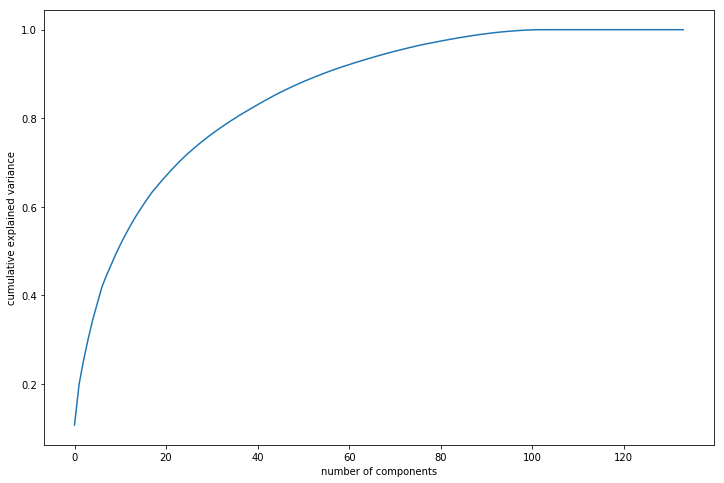

In [49]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

80 components explain almost 95% of variance.

In [50]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=80)

In [51]:
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(18245, 80)

In [52]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

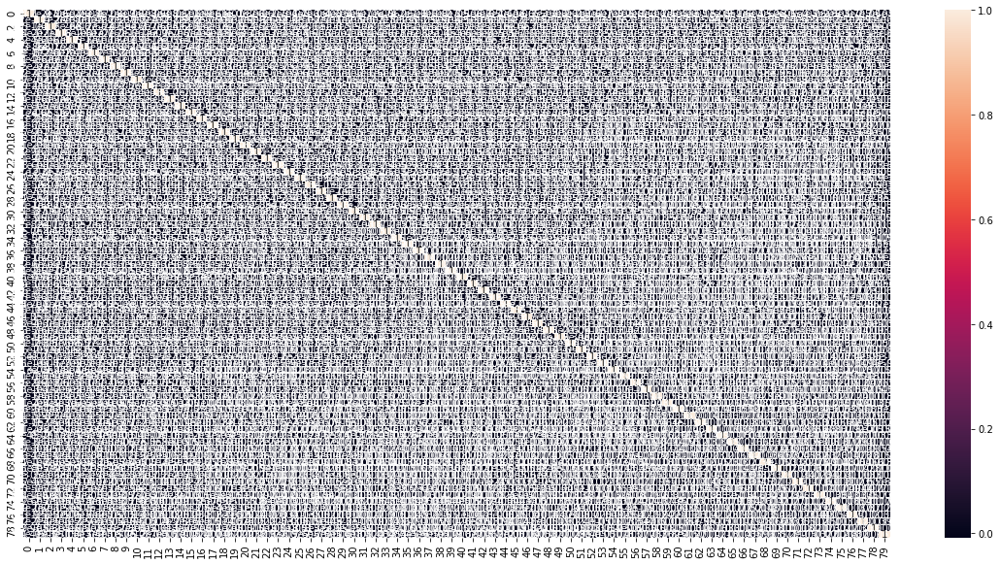

In [106]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [53]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.013711667386375914 , min corr:  -0.008636617015270912


In [54]:
#Applying selected components to the test data - 16 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(7820, 80)

### PCA + Logistic Regression

In [55]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

pca_logreg = LogisticRegression(class_weight ='balanced')
pca_logreg_model = pca_logreg.fit(df_train_pca,y_train)

In [56]:
y_train_pred_pca = pca_logreg_model.predict(df_train_pca)

In [57]:
y_test_pred_pca = pca_logreg_model.predict(df_test_pca)

In [58]:
print('Checking train metrics')
print(metrics.accuracy_score(y_train, y_train_pred_pca))
print(metrics.recall_score(y_train, y_train_pred_pca))

Checking train metrics
0.8147985749520417
0.8340847610459874


In [59]:
print('Checking Test metrics')
print("Accuracy:",metrics.accuracy_score(y_test, y_test_pred_pca))
print("Recall:",metrics.recall_score(y_test, y_test_pred_pca))
print("specificity:",metrics.recall_score(y_test, y_test_pred_pca))

Checking Test metrics
Accuracy: 0.810230179028133
Recall: 0.8145833333333333


We have got almost similar metrics for train and test dataset.
let's try different technique to handle class imbalance.

In [63]:
pca_feature_coef = pcs_df.head(80)

In [64]:
pca_feature_coef['feature_coef'] = pca_logreg_model.coef_[0]

In [65]:
# pca components with features ana coefficients using Logistic Regression
pca_feature_coef.sort_values(by=['feature_coef'])

,PC1,PC2,Feature,feature_coef
31,-0.053368,0.180881,std_og_t2t_mou_7,-0.654381
51,0.055655,0.207614,total_og_mou_6,-0.480470
0,0.119012,0.126213,arpu_6,-0.376913
3,-0.002354,0.156183,onnet_mou_6,-0.354675
35,-0.006988,0.177491,std_og_t2m_mou_8,-0.315299
34,-0.019972,0.181908,std_og_t2m_mou_7,-0.232123
55,0.134120,-0.019551,loc_ic_t2t_mou_7,-0.232077
28,0.194738,0.007469,loc_og_mou_7,-0.205307
79,0.209898,-0.027243,total_ic_mou_7,-0.198633
70,0.043042,0.046859,std_ic_t2m_mou_7,-0.191306


### Using SMOTE to handle class imbalance

In [ ]:
from imblearn.combine import SMOTETomek
smt = SMOTETomek(ratio='auto')
x_smt_train, y_smt_train = smt.fit_sample(df_train_pca, y_train)
x_smt_test, y_smt_test = smt.fit_sample(df_test_pca, y_test)

Using TensorFlow backend.


In [ ]:
x_smt_train.shape

In [61]:
x_smt_test.shape

(14680, 80)

### Logistic Regression on SMOTE dataset

In [62]:
pca_smt_logreg = LogisticRegression()
pca_smt_logreg_model = pca_smt_logreg.fit(x_smt_train,y_smt_train)

In [63]:
# Predicting on train data generated by SMOTE
y_train_pred_pca_smt = pca_smt_logreg.predict(x_smt_train)

In [64]:
# Predicting on test data generated by SMOTE
y_test_pred_pca_smt = pca_smt_logreg.predict(x_smt_test)

In [67]:
# Predicting on test data generated by PCA
y_test_predsmt_pca = pca_smt_logreg.predict(df_test_pca)

In [65]:
print('Metrics for: Train data generated by SMOTE')
print(metrics.accuracy_score(y_smt_train, y_train_pred_pca_smt))
print(metrics.recall_score(y_smt_train, y_train_pred_pca_smt))

Checking train metrics
0.842185128983308
0.8592272674215011


In [66]:
print('Metrics for: Test data generated by SMOTE')
print(metrics.accuracy_score(y_smt_test, y_test_pred_pca_smt))
print(metrics.recall_score(y_smt_test, y_test_pred_pca_smt))

Checking train metrics
0.8416893732970028
0.8629427792915532


In [68]:
print('Metrics for: Test data generated by PCA')
print(metrics.accuracy_score(y_test, y_test_predsmt_pca))
print(metrics.recall_score(y_test, y_test_predsmt_pca))

Checking train metrics
0.8191815856777493
0.8


There is not much improvement in accuracy and recall after using SMOTE.

### Random Forest - (With PCA)

In [112]:
rf_pca = RandomForestClassifier(n_jobs=-1,
                                bootstrap=True,
                                max_depth=4,
                                min_samples_leaf=50,
                                min_samples_split=24,
                                n_estimators=50,
                                max_features= 'auto',
                                criterion = 'gini',
                            class_weight='balanced')

In [113]:
rf_pca.fit(df_train_pca, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=24, min_weight_fraction_leaf=0.0,
                       n_estimators=50, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [114]:
 predictions = rf_pca.predict(df_test_pca)

In [116]:
print(classification_report(y_test, predictions))
print(accuracy_score(y_true=y_test, y_pred=predictions))
print(confusion_matrix(y_test, predictions))

              precision    recall  f1-score   support

           0       0.98      0.86      0.92      7340
           1       0.25      0.69      0.37       480

    accuracy                           0.85      7820
   macro avg       0.61      0.78      0.64      7820
weighted avg       0.93      0.85      0.88      7820

0.8529411764705882
[[6337 1003]
 [ 147  333]]


In [117]:
print("Accuracy",metrics.accuracy_score(y_test,predictions))
print("Racall",metrics.recall_score(y_test,predictions))

Accuracy 0.8529411764705882
Racall 0.69375


### Random Forest - (Without PCA)

In [107]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_jobs=-1,
                                bootstrap=True,
                                max_depth=4,
                                min_samples_leaf=50,
                                min_samples_split=24,
                                n_estimators=50,
                                max_features= 'auto',
                                criterion = 'gini',
                            class_weight='balanced')

In [108]:
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=24, min_weight_fraction_leaf=0.0,
                       n_estimators=50, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [109]:
 predictions_t = rf.predict(X_test)

In [110]:
print(classification_report(y_test, predictions_t))
print(accuracy_score(y_true=y_test, y_pred=predictions_t))
print(confusion_matrix(y_test, predictions_t))

              precision    recall  f1-score   support

           0       0.98      0.88      0.93      7340
           1       0.29      0.76      0.42       480

    accuracy                           0.87      7820
   macro avg       0.64      0.82      0.68      7820
weighted avg       0.94      0.87      0.90      7820

0.8730179028132993
[[6461  879]
 [ 114  366]]


In [111]:
print("Accuracy",metrics.accuracy_score(y_test,predictions_t))
print("Racall",metrics.recall_score(y_test,predictions_t))

Accuracy 0.8730179028132993
Racall 0.7625


Accuracy and recall reduced after using PCA with Random Forest

### XGBoost:

In [122]:
from xgboost import XGBClassifier
xgb = XGBClassifier(learning_rate=0.1, n_estimators=150, max_depth=4, min_child_weight=7, 
                      gamma=0.4,nthread=4, subsample=0.8, colsample_bytree=0.8,
                      objective= 'binary:logistic',scale_pos_weight=3,seed=29)


xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

In [123]:
print("Accuracy",metrics.accuracy_score(y_test,y_pred_xgb))
print("Racall",metrics.recall_score(y_test,y_pred_xgb))

Accuracy 0.9450127877237852
Racall 0.6166666666666667


#### So far we have got best accuracy and recall score using Logistic Regression + PCA

In [125]:
confusion_metric = metrics.confusion_matrix(y_test, y_test_pred_pca)

In [126]:
confusion_metric

array([[5945, 1395],
       [  89,  391]], dtype=int64)

In [127]:
TP = confusion_metric[1,1] # true positive 
TN = confusion_metric[0,0] # true negatives
FP = confusion_metric[0,1] # false positives
FN = confusion_metric[1,0] # false negatives

In [128]:
# Calculate sensitivity / recall
TP / float(TP+FN)

0.8145833333333333

In [129]:
# Calculate specificity
TN / float(TN+FP)

0.8099455040871935

In [130]:
print("Accuracy:",metrics.accuracy_score(y_test, y_test_pred_pca))

Accuracy: 0.810230179028133


##### Summary Table of top 5 important features

In [124]:
# Top 5 important features
pca_feature_coef.sort_values(by=['feature_coef']).head(5)

,PC1,PC2,Feature,feature_coef
31,-0.053368,0.180881,std_og_t2t_mou_7,-0.654381
51,0.055655,0.207614,total_og_mou_6,-0.480470
0,0.119012,0.126213,arpu_6,-0.376913
3,-0.002354,0.156183,onnet_mou_6,-0.354675
35,-0.006988,0.177491,std_og_t2m_mou_8,-0.315299


Fram above observations best features that influence churn are:
- std out going calls to fixed lines of t 
- total outgoing calls
- average revenue per user
- all kinds of calls within opetarot t 
- std outgoing calls to other operator mobile

We can say from above observations as std out going calls increases in good pahse or action phase, we can give special benefits to such customers as increase in usage cost may lead to customer churn.

#### We have achieved Sensitivity of 81%. That means with this model we are able to predict 81% of customers which are likely to churn.